In [1]:
import os
import glob
import xml.etree.ElementTree as ET
import pandas as pd
import tensorflow as tf
print(tf.__version__)

2.9.2


In [2]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
   raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

# memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm() 

Found GPU at: /device:GPU:0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for gputil: filename=GPUtil-1.4.0-py3-none-any.whl size=7409 sha256=e822fd0ac4f6cfc4bd99aa7f8c5a4ee9deb37284561c41e82a8f5a6cc1224cf4
  Stored in directory: /root/.cache/pip/wheels/ba/03/bb/7a97840eb54479b328672e15a536e49dc60da200fb21564d53
Successfully built gputil
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Gen RAM Free: 11.8 GB  | Proc size: 1.2 GB
GPU RAM Free: 14797MB | Used: 312MB | Util   2% | Total 15109MB


In [3]:
# connet to google drive
from google.colab import drive
drive.mount('/content/gdrive')

%cd '/content/gdrive/My Drive/models/'

Mounted at /content/gdrive
/content/gdrive/My Drive/models


In [4]:
#navigate to /models/research folder to compile protos
%cd research

# Compile protos.
!protoc object_detection/protos/*.proto --python_out=.

# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

/content/gdrive/My Drive/models/research
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/gdrive/MyDrive/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 82.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.1/352.1 KB 38.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 86.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 41.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 KB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.9/238.9 KB 25.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 588.3/588.3 MB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 59.7 MB/s eta 0:00:00
   

In [5]:
# testing the model builder under object_detection folder
# %cd object_detection
!python object_detection/builders/model_builder_tf2_test.py

2023-01-05 19:24:45.034500: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-01-05 19:24:45.034669: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-01-05 19:24:45.034702: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
Running tests under Python 3.8.16: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2023-01-05 19:24:48.767926: W tensorflow/core/commo

In [ ]:
# if not for test, no need to run this cell
# this section is used to test the object-detection.pbtxt file (label map file)
# make sure you are in the directory which object-detection.pbtxt belongs to, if not you can manully modify the file path 

# def read_label_map(label_map_path):

#     item_id = None
#     item_name = None
#     items = {}
    
#     with open(label_map_path, "r") as file:
#         for line in file:
#             line.replace(" ", "")
#             if line == "item{":
#                 pass
#             elif line == "}":
#                 pass
#             elif "id" in line:
#                 item_id = int(line.split(":", 1)[1].strip())
#             elif "name" in line:
#                 item_name = line.split(":", 1)[1].replace("'", "").strip()

#             if item_id is not None and item_name is not None:
#                 items[item_name] = item_id
#                 item_id = None
#                 item_name = None

#     return items

# print ([i for i in read_label_map("object-detection.pbtxt")])

In [11]:
# Run the command below from the content/models/research/object_detection directory
"""
PIPELINE_CONFIG_PATH=path/to/pipeline.config
MODEL_DIR=path to training checkpoints directory
NUM_TRAIN_STEPS=50000
SAMPLE_1_OF_N_EVAL_EXAMPLES=1

python model_main_tf2.py -- \
  --model_dir=$MODEL_DIR --num_train_steps=$NUM_TRAIN_STEPS \
  --sample_1_of_n_eval_examples=$SAMPLE_1_OF_N_EVAL_EXAMPLES \
  --pipeline_config_path=$PIPELINE_CONFIG_PATH \
  --alsologtostderr
"""
# %cd object_detection
!python model_main_tf2.py --pipeline_config_path=training/pipeline.config --model_dir=faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8 --alsologtostderr

2023-01-05 20:06:51.737539: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-01-05 20:06:51.737760: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-01-05 20:06:51.737784: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
/content/gdrive/MyDrive/models/research/object_detection/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to op

In [14]:
##Export inference graph and save trained model
!python exporter_main_v2.py --input_type image_tensor --trained_checkpoint_dir=faster_rcnn_inception_resnet_v2_1024x1024_coco17_tpu-8 --pipeline_config_path=training/pipeline.config --output_directory inference_graph

2023-01-05 21:19:59.504670: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-01-05 21:19:59.504815: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-01-05 21:19:59.504839: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
/content/gdrive/MyDrive/models/research/object_detection/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to op

Loading model...Done!
category_index {1: {'id': 1, 'name': 'insect'}}
images/test/trap62-2022-04-27-17-32-06-784 (2).jpeg
detected insects number for image  images/test/trap62-2022-04-27-17-32-06-784 (2).jpeg is:  7


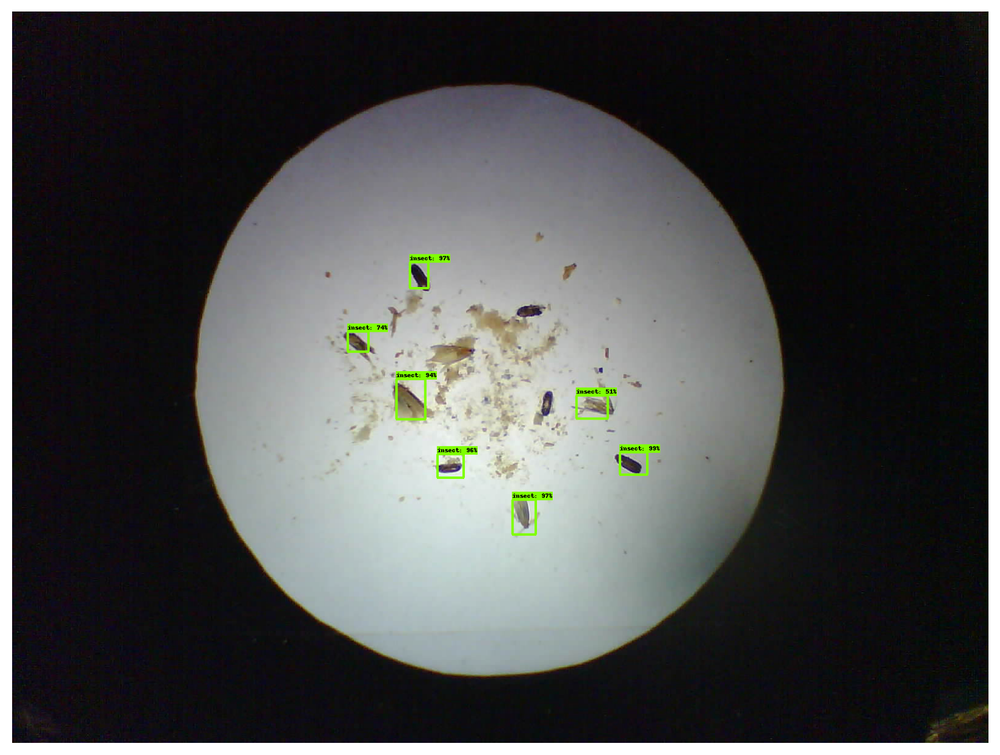

images/test/trap100504-2022-10-30-13-38-08-779.jpeg
detected insects number for image  images/test/trap100504-2022-10-30-13-38-08-779.jpeg is:  6


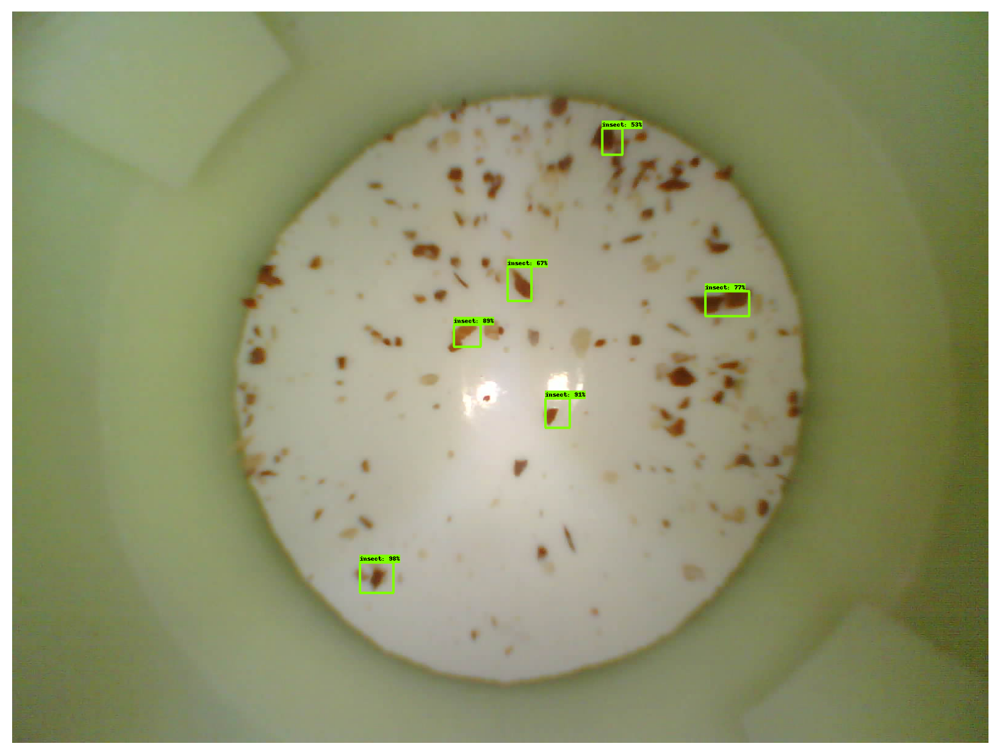

images/test/trap100702-2022-10-29-12-15-14-270.jpeg
detected insects number for image  images/test/trap100702-2022-10-29-12-15-14-270.jpeg is:  2


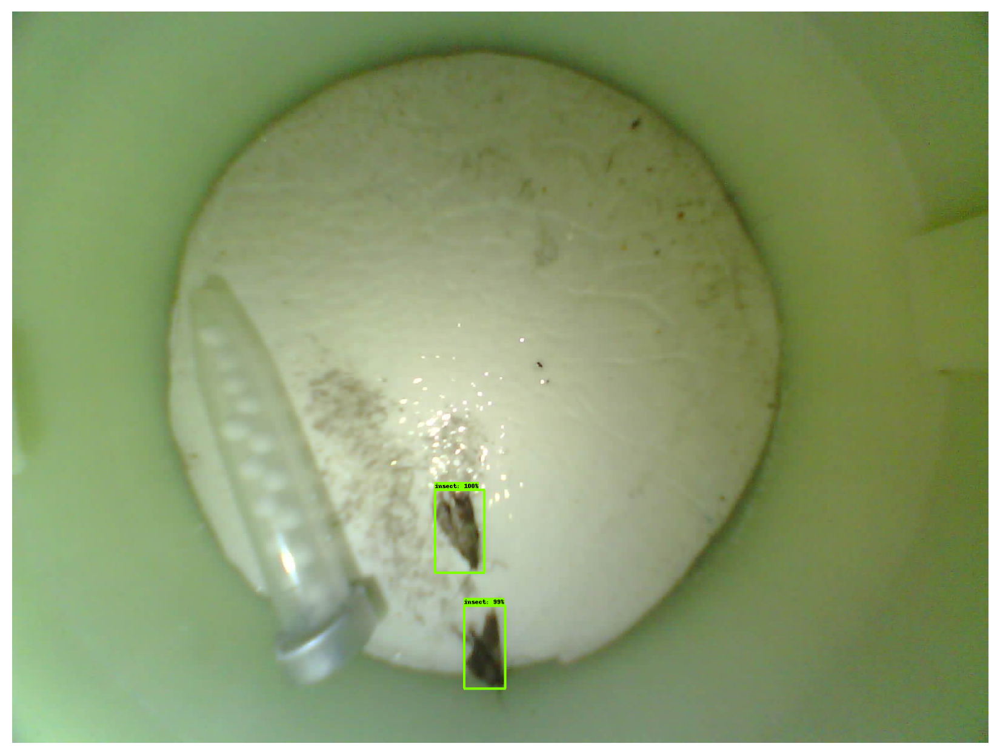

images/test/trap100702-2022-10-31-12-15-44-879.jpeg
detected insects number for image  images/test/trap100702-2022-10-31-12-15-44-879.jpeg is:  8


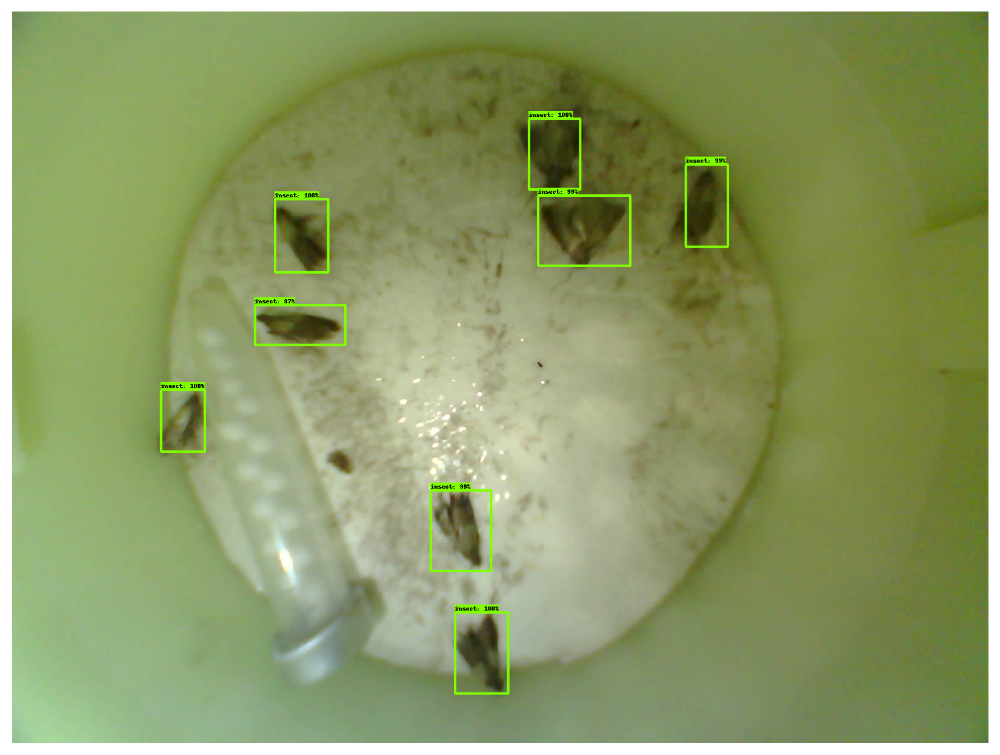

images/test/trap100702-2022-11-03-12-16-28-953.jpeg
detected insects number for image  images/test/trap100702-2022-11-03-12-16-28-953.jpeg is:  9


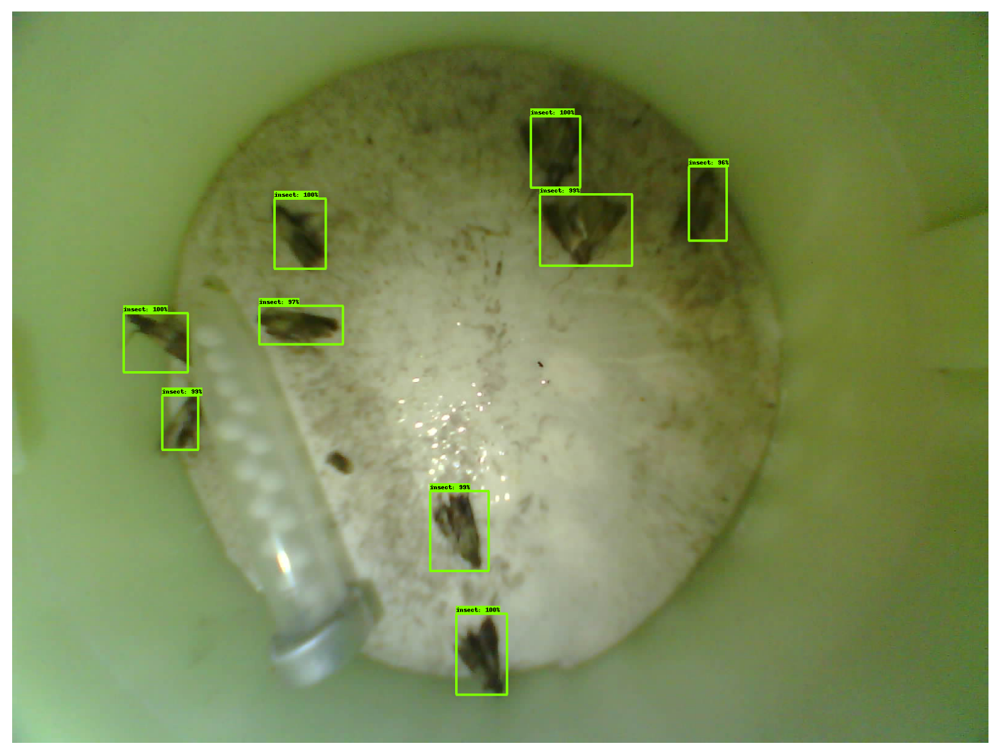

images/test/trap100702-2022-11-07-12-17-29-153.jpeg
detected insects number for image  images/test/trap100702-2022-11-07-12-17-29-153.jpeg is:  10


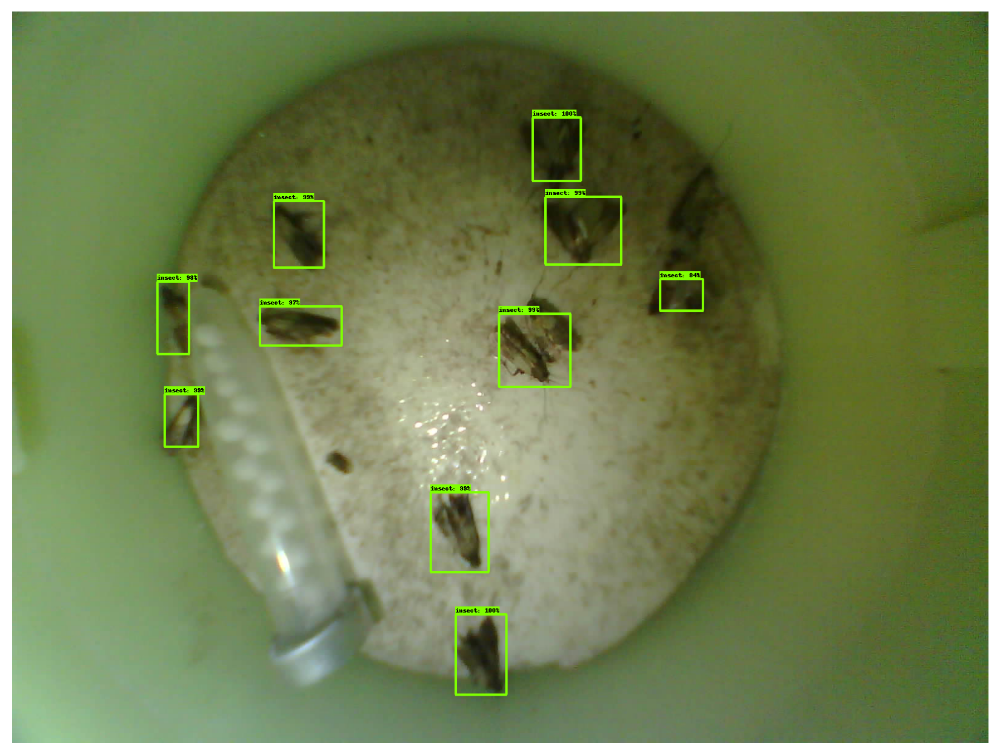

images/test/trap200102-2022-10-28-15-57-55-419.jpeg
detected insects number for image  images/test/trap200102-2022-10-28-15-57-55-419.jpeg is:  1


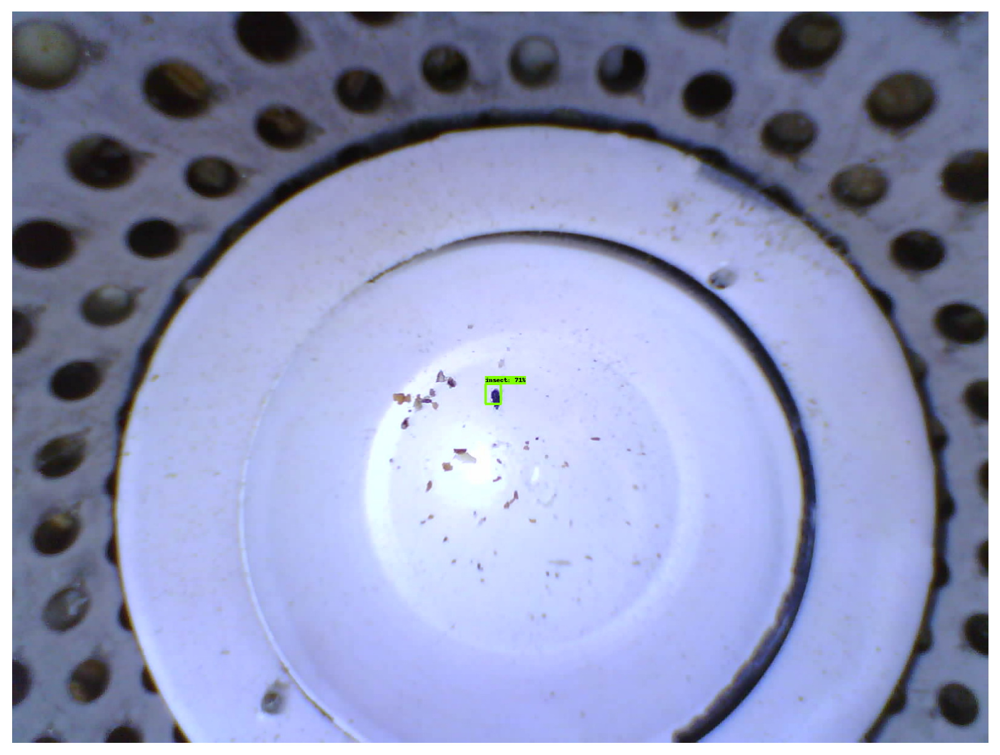

images/test/trap200102-2022-10-29-15-58-10-769.jpeg
detected insects number for image  images/test/trap200102-2022-10-29-15-58-10-769.jpeg is:  2


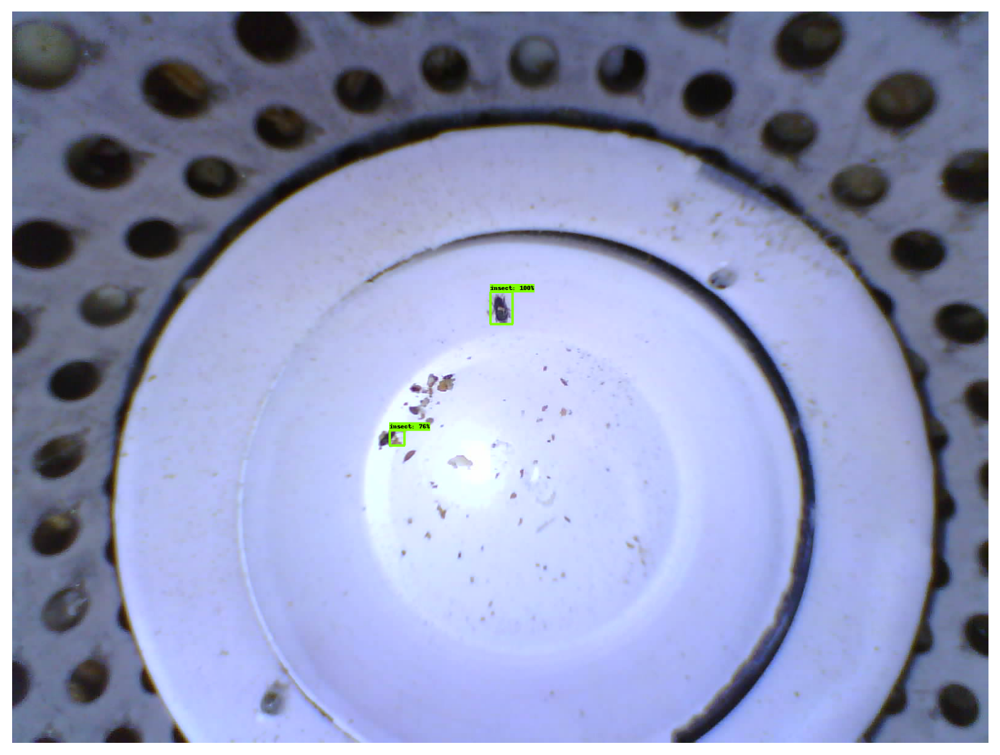

images/test/trap102-2022-12-21-17-30-04-083.jpeg
detected insects number for image  images/test/trap102-2022-12-21-17-30-04-083.jpeg is:  12


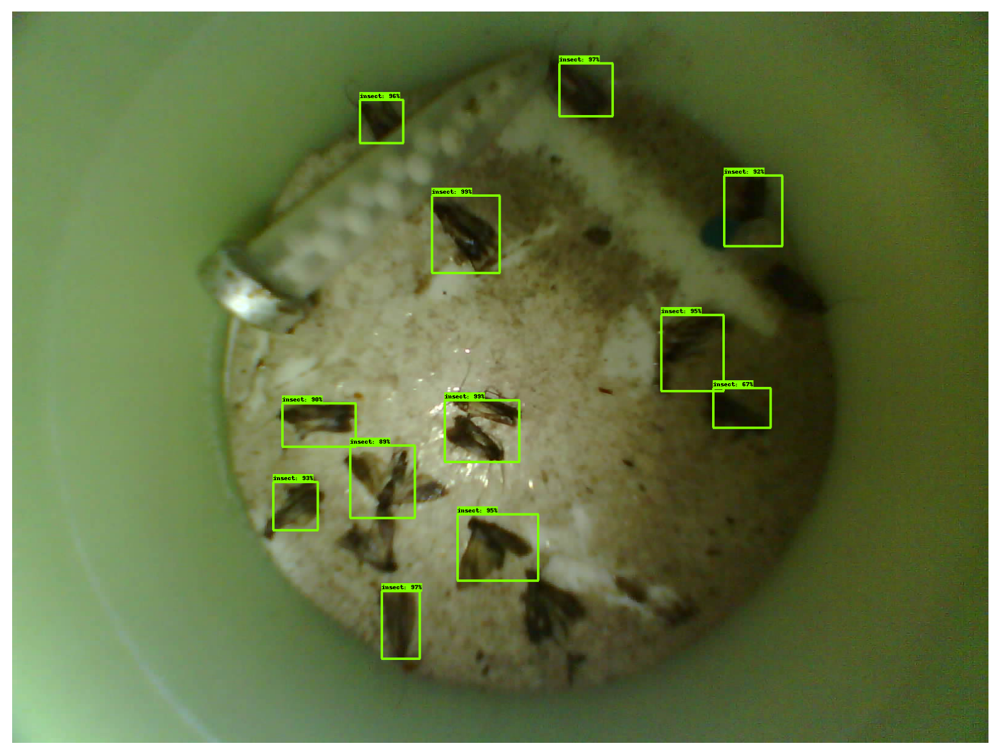

images/test/trap100100004-2022-11-18-15-37-00-771.jpeg
detected insects number for image  images/test/trap100100004-2022-11-18-15-37-00-771.jpeg is:  0


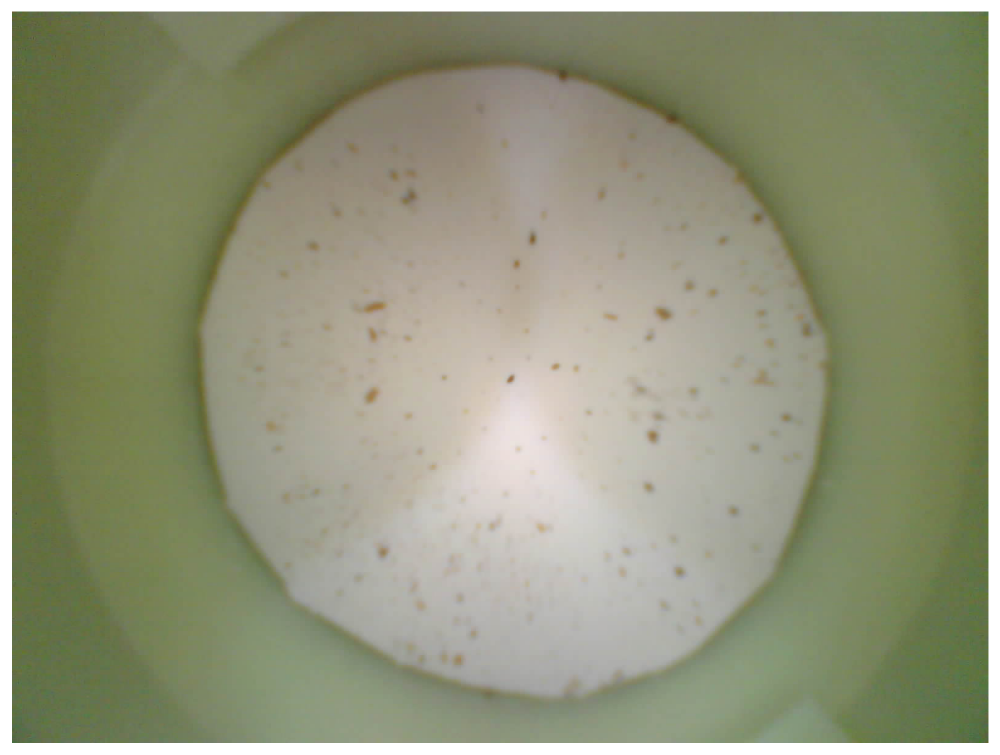

In [33]:
#Loading the saved_model
import tensorflow as tf
import time
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

IMAGE_SIZE = (12, 8) # Output display size as you want
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="inference_graph/saved_model"
print('Loading model...', end='')

# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("training/object-detection.pbtxt", use_display_name=True)
print("category_index", category_index)
def load_image_into_numpy_array(path):

    return np.array(Image.open(path))

# image_path = "images/test/trap100702-2022-10-31-12-15-44-879.jpeg"
image_path = "images/test/trap200102-2022-10-29-15-58-10-769.jpeg"

image_path_base = "images/test/"
filenames = ['trap62-2022-04-27-17-32-06-784 (2).jpeg', 'trap100504-2022-10-30-13-38-08-779.jpeg', 'trap100702-2022-10-29-12-15-14-270.jpeg', 'trap100702-2022-10-31-12-15-44-879.jpeg', 'trap100702-2022-11-03-12-16-28-953.jpeg', 'trap100702-2022-11-07-12-17-29-153.jpeg', 'trap200102-2022-10-28-15-57-55-419.jpeg', 'trap200102-2022-10-29-15-58-10-769.jpeg', 'trap102-2022-12-21-17-30-04-083.jpeg', 'trap100100004-2022-11-18-15-37-00-771.jpeg']
image_paths = []
for filename in filenames:
    image_paths.append(str(image_path_base + filename))

#print('Running inference for {}... '.format(image_path), end='')

for image_path in image_paths: 
  print(image_path)
  image_np = load_image_into_numpy_array(image_path)

  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image_np)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis, ...]

  detections = detect_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(detections.pop('num_detections'))
  # print(num_detections)
  detections = {key: value[0, :num_detections].numpy()
                for key, value in detections.items()}
  detections['num_detections'] = num_detections

  # detection_classes should be ints.
  detections['detection_classes'] = detections['detection_classes'].astype(np.int64)


  num_insect = sum(1 for score in detections['detection_scores'] if score > 0.5)
  print("detected insects number for image ", image_path, 'is: ', num_insect)

  image_np_with_detections = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=.5, # Adjust this value to set the minimum probability boxes to be classified as True
        agnostic_mode=False)
  %matplotlib inline
  plt.figure(figsize=IMAGE_SIZE, dpi=200)
  plt.axis("off")
  plt.imshow(image_np_with_detections)
  plt.show()